# End to End Multi-Class Classification
This notebook builds and end-to-end multi-class image classifier using TensorFlow and TensorFlow Hub

##Problem
Trying to identify the breed of a dog, given an image of a dog. There are 120 different breeds.

##Data
Kaggles Dog Breed Identification Competition:
https://www.kaggle.com/c/dog-breed-identification/overview

#Evaluation
Multi-class Log Loss.
Predicted probability for each dog breed of each test image.

##Features
Unstructured data: Images
Deep Learning / Transfer Learning
Multi-Class Classification: 120 Breeds of Dogs
Training Set: Around 10,000 images (w/ labels)
Test Set: Around 10,000 images (w/o labels)

In [1]:
#Unzip the data
#!unzip "/content/drive/MyDrive/Dog Identify/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Identify/"

Preparing Workspace:

In [2]:
#Import TensorFlow
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:", tf.__version__)
print("TF Hub Version:", hub.__version__)

#Check for GPU Availability
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

TF Version: 2.13.0
TF Hub Version: 0.14.0
GPU Available


Getting Our Data Ready - Turning data into Tensors

1. Our data must be in Numerical Format

In [3]:
#Accessing our data and checking labels
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Identify/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
#How many images are there of each breed
labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

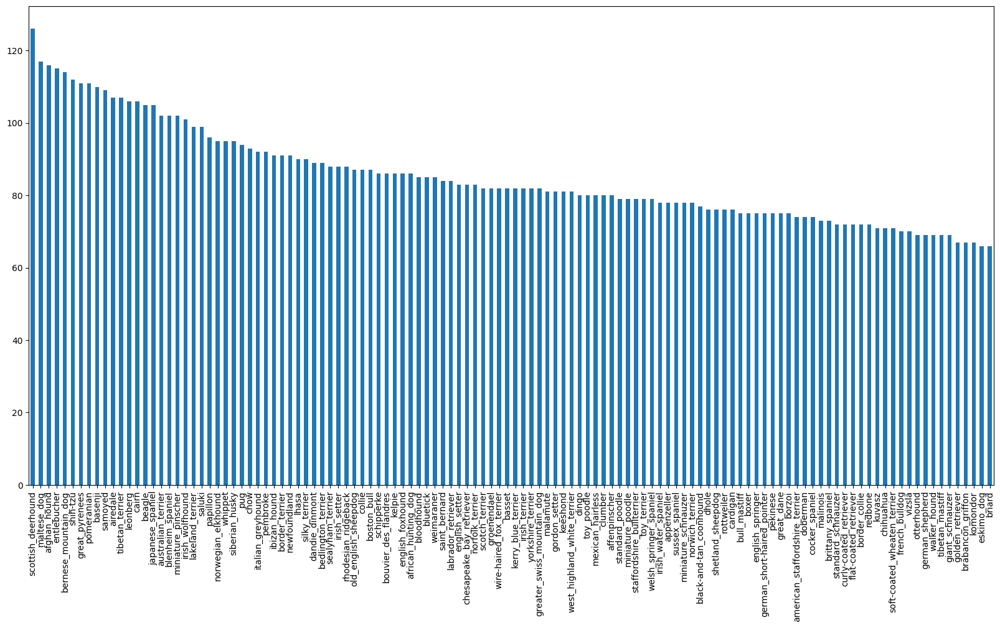

In [5]:
#Visualise
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

This shows all 120 breeds, and the number of images they have.

Google reccomends 100 annotations per label, but at least 10 images per class

In [6]:
#Finding the median number of images for all 120 breeds
labels_csv.breed.value_counts().median()

82.0

Preparing the Images

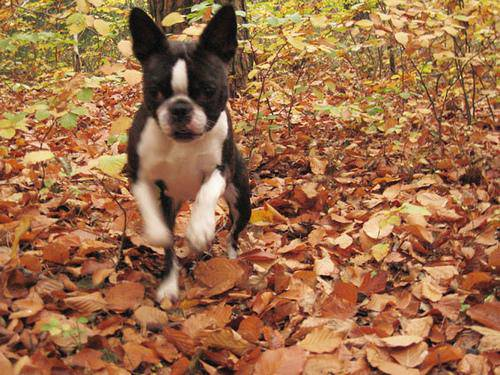

In [7]:
from IPython.display import Image

#Viewing an image. Taking the ID from when we viewed the labels_csv.head()
Image("/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [8]:
#Getting images and their labels - getting a list of image file path names
filenames = ["/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv.id]

filenames[:10]

['/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog

In [9]:
#Ensure we are using the same amount of data - Does file names match actual number of image files?
import os

if len(os.listdir("/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/")) == len(filenames):
  print("Filenames match actual amount of files.")
else:
  print("Filenames do not match actual amount of files. Check target directory.")

Filenames match actual amount of files.


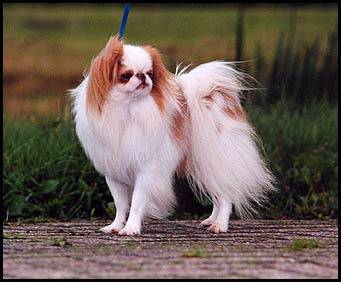

In [10]:
#Let's make sure the filenames match
Image(filenames[293])

In [11]:
labels_csv["breed"][293]

'japanese_spaniel'

Preparing Labels

Now we have our training image filepaths in a list, we can prepare our labels

In [12]:
#Import
import numpy as np

#Create a variable for the labels (breed)
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
len(labels)

10222

In [14]:
#Check for missing data - Checking if number of labels matches number of filenames
if len(labels) == len(filenames):
  print("Matching number of labels and file names.")
else:
  print("Number of labels does not match number of filenames. Check data directories.")

Matching number of labels and file names.


In [15]:
#Finding the unique label ID's
unique_breeds = np.unique(labels)
len(unique_breeds), unique_breeds[:10]

(120,
 array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle'], dtype=object))

In [16]:
#There are 120 breeds, now with unique labels.

In [17]:
#Turn labels into boolean arrays
bool_labels = [label == unique_breeds for label in labels]
bool_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(bool_labels)

10222

In [19]:
#We have now turned every label into a unique boolean label.
#Now we can convert these boolean arrays into  numbers

print(labels[0]) #accessing original label
print(np.where(unique_breeds == labels[0])) #accessing where label occurs
print(bool_labels[0].argmax()) #index where label occurs in bool array
print(bool_labels[0].astype(int)) #printing bool label as integer

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Creating a Validation Set

We have a trainig and test set, but the validation set was not provided by Kaggle. Therefor, we must make our own to validate our initial experiments.

In [20]:
#Define X and y variables
X = filenames
y = bool_labels

In [21]:
#Experimenting with 1000 images (with a silder)
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10222, step:1000}

In [22]:
#Splitting our data into train and validation
#Import train_test_split
from sklearn.model_selection import train_test_split

#Split into training and validation of total size of num_images
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [23]:
#Viewing our training data
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Identify/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

In [24]:
#X_train shows the file paths

#y_train shows the bool_labels

Preprocessing Images - Turning images into Tensors (numerical representation)

Our function:
* Create filepaths
* Use Tensorflow to read file and save it to a variable
* Turn our variable (jpg) into Tensors
* Normalise our image (convert colour channels from 0-255 to 0-1)
* Resize all images to a default size (224, 224)
* Return modified image

In [25]:
#Define Image Size
IMG_SIZE = 224

#Function for preprocessing image
def process_image(image_path):
  """
  Takes an image filepath and turns an image into a Tensor
  """

  #Reading in an image file
  image = tf.io.read_file(image_path) #takes filename and turns contents into Tensor
  #Turn jpg image into numerical Tensor with 3 colour channels (R,G,B)
  image = tf.image.decode_jpeg(image, channels=3)
  #Normalisation - Convert colour channels from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

Turning our data into Batches

--> Taking 32 images and calculating on those at one time. Creating a batch of 32 images.

Why?
* They all might not fit into memory if we do too much at once

We must create Tensor Tuples in the form of (image, labels), and pass 32 at a time, until it gets through all 10222 images.

In [26]:
#Creating our Tuples of Tensors
def get_image_label(image_path, label):
  """
  Takes image file path name and associated label.
  Processes the image and returns a tuple of image label.
  """
  image = process_image(image_path)
  return image, label

In [27]:
#Example
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [28]:
#Now we have a tuple of an image and label pair in the form of Tensors

In [29]:
#Turning our data into Batches
#Define batch size (32)
BATCH_SIZE = 32

#Function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image X and label y pairs.
  It shuffles the data if its training data.
  Does not shuffle if its validation data.
  Accepts test data as input (which doesnt have y labels)
  """
  #If the data is test, it does not have labels:
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #Only filepaths - no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE) #turns into data batch
    return data_batch

  #If that data is a valid dataset, no need to shuffle:
  elif valid_data:
    print("Creating valididation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  #Training batch, which we want to shuffle
  else:
    print("Creating training data batches...")
    #Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    #Shuffle pathnames and labels before mapping image processor function as it is faster
    data = data.shuffle(buffer_size=len(X))

    #Create image label tuples. Also turns image path into preprocessed image
    data = data.map(get_image_label)

    #Turn data into data batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [30]:
#Creating training and validation batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating valididation data batches...


In [31]:
#Looking at different attributes of our data batches, now that it is in the format of a data batch
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [32]:
#Shape is 224, 224.

#3 colour channels

#Tuple form

#Image label pairs in the form of Tensors

#Have batch shape of none because it is flexible

#Labels have dimension of 120 (there are 120 different dog breeds)

Visualising Data Batches

Now that our data is in batches, we can make them easier to comprehend by visualising our data.

In [33]:
import matplotlib.pyplot as plt

#Function for viewing images in data batches
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  #Figure
  plt.figure(figsize=(10,10))
  #Loop through 25 images
  for i in range(25):
    #Create subplots (5 rows, 5 columns, index)
    ax = plt.subplot(5,5, i+1)
    #Display Image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #No grid lines
    plt.axis("off")

In [34]:
#Train data is in the format of a batch
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [35]:
#We need to turn train_data into an iterator
train_images, train_labels = next(train_data.as_numpy_iterator())

In [36]:
#Takes our batch dataset
#Unwinds it from a batch into a numpy iterator.
#"next" grabs the first batch.
#It is then split so that train_images is the first thing to get returned, and train_labels will be the next

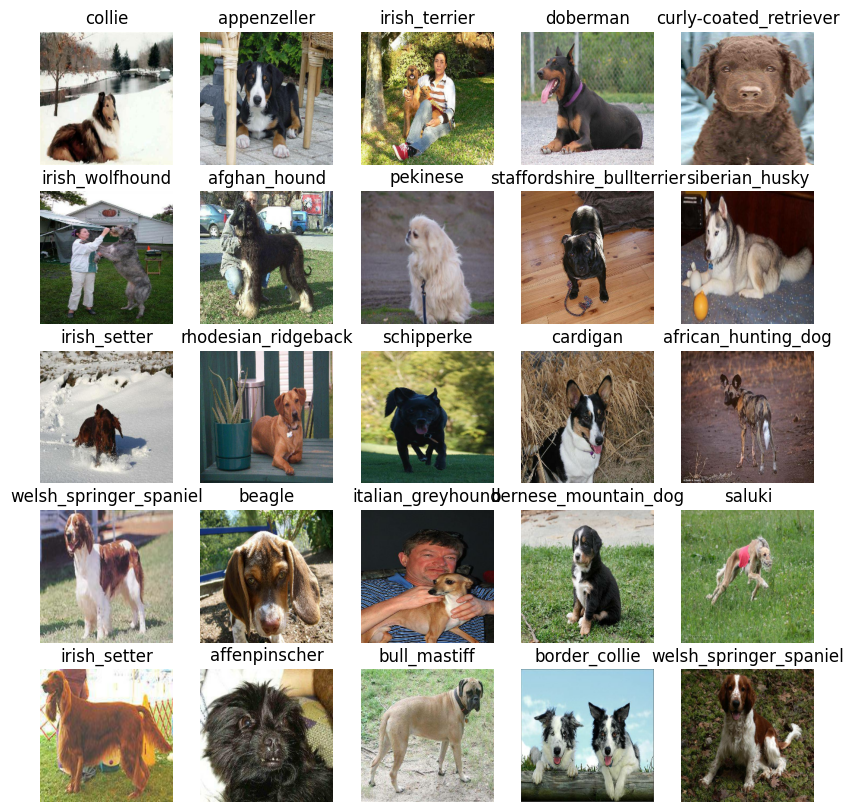

In [37]:
#Now to visualise data
show_25_images(train_images, train_labels)

In [38]:
#This is our training batch which is shuffled.

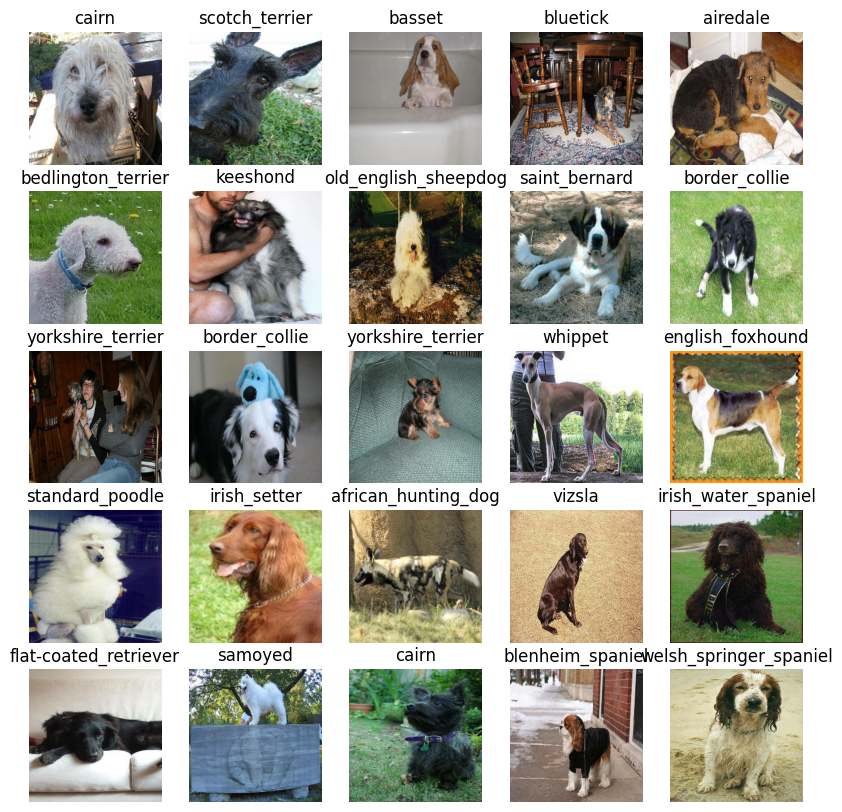

In [39]:
#Let's visualise our val_data set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [40]:
#This is our validation batch, which is not shuffled.

Building our Model (using transfer learning)

We must first define:
1. Input shape, image shape, in the form of Tensors
2. Output shape, image labels, in the form of Tensors
3. The URL of the model we want to use (from TensorFlow Hub)
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

(define inputs, outputs and model)

In [41]:
#Set up input shape for model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #[batch, height, width, colour channel]

#Set up output shape for model
OUTPUT_SHAPE = len(unique_breeds)

#Set up model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Keras Deep Learning Model:
https://www.tensorflow.org/guide/keras/overview

Now we have out inputs, outputs and model, we can create a Keras deep learning model using a function that:

* Takes the input shape, output shape and model as parameters
* defines layers in a subquential pattern (step-by-step)
* Compiles the model (how it should be evaluated and improved)
* Build the model (tells the model the input shape it will be getting)
* Returns the model

In [42]:
#Function to create a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with", MODEL_URL)

  #Set up model layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), #input layer
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax"), #layer 2
                               ])
  #Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
  #Build the model
  model.build(INPUT_SHAPE)

  #Return model
  return model

In [43]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


* Trainable params corresponds to dense param #
* Non-trainable params corresponds to kerasLayer param #

- The reason it shows non-trainable params is because we are using Mobile Net V2, which has found patterns using ImageNet and uses baseline patterns to figure out what is in our images, and classify which dog breed is in a certain image.


## Creating Callbacks

= Helper function a model can use during training to; save progress, check progress and stop training early if model stops improving

We will create two
1. TensorBoard (helps track models progress)
  * Load TensorBoard extension
  * Create TensorBoard callback to save logs to a directory and pass it through our models fit() function
  * Visualise models training logs with %tensorboard magic function (after model training)
2. EarlyStopping (stops our model from overfitting by stopping training if an evaluation metric stops improving)

In [44]:
#Load TensorBoard notebook extension
%load_ext tensorboard

In [45]:
import datetime #to track each experiment using date and time

#Function for TensorBoard callback
def create_tensorboard_callback():
  #Create log directory to store tensorboard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Identify/dog-breed-identification/logs",
                        #Make it so logs get tracked whenever an experiment is run
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [46]:
#Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model will train on 1000 images to ensure everything is working.

In [47]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100, step:10}

In [48]:
#Double-check we are using a GPU
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Available


## Creating a function that trains a model

1. Create a model using create_model()
2. Setup a TensorBoard callback using create_tensorboard_callback()
3. Call fit() function on our model passing it training data, validation data, number of epochs to train for, and callbacks we'd like to use
4. Return a model


In [49]:
#Function to train and return trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model = create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  #Return the fitted model
  return model

In [50]:
#Fit model to the data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 143s 5s/step - loss: 4.5041 - accuracy: 0.1125 - val_loss: 3.4087 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 3s 105ms/step - loss: 1.5952 - accuracy: 0.7138 - val_loss: 2.1558 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 104ms/step - loss: 0.5531 - accuracy: 0.9362 - val_loss: 1.6656 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 3s 127ms/step - loss: 0.2485 - accuracy: 0.9825 - val_loss: 1.4831 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 3s 101ms/step - loss: 0.1452 - accuracy: 0.9975 - val_loss: 1.4006 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 3s 106ms/step - loss: 0.1003 - accuracy: 0.9975 - val_loss: 1.3636 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================] 

Our model has stopped on the 10th epoch. This is because of our early_stopping callback.

Our model on our trainig data set is performing as 100% accuracy, and 0.04% loss.

You can tell our model is overfitting, as it is performing better on our training data than our validation data, with 67.5% accuracy.

Our model has a poor ability to generalise at this stage.

The overfitting at this stage is a good thing, it means our model is learning.

## Checking the TensorBoard Logs

The TensorBoard magic function %tensorboard will access the logs directory (with logdir tag and file path) we created earlier, and visualise its contents.

We use \ to escape the spaces in the file path.

In [51]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Identify/dog-breed-identification/logs

<IPython.core.display.Javascript object>

The experiments. we have run so far is on the left.

Now we can visualise what has been happening throughout our models learning process.

## Making and Evaluating Predictions using a trained model

In [52]:
#Make predicitons on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 83ms/step


array([[2.9546581e-04, 3.7506124e-05, 3.0859528e-04, ..., 1.6920007e-03,
        1.2078911e-05, 6.0141925e-03],
       [1.3708599e-03, 1.8340418e-03, 6.6320812e-03, ..., 1.1181411e-03,
        9.8100724e-04, 5.8630925e-05],
       [5.8931582e-06, 7.7896520e-06, 7.3499082e-06, ..., 2.2035176e-06,
        5.8158312e-06, 2.7880578e-05],
       ...,
       [3.0429090e-05, 8.9312007e-06, 1.3829551e-05, ..., 1.4712876e-05,
        1.0989372e-04, 2.4076109e-04],
       [6.5548629e-03, 1.3231902e-04, 4.6410714e-04, ..., 9.1724134e-05,
        8.7050219e-05, 1.1156043e-02],
       [2.3394432e-04, 1.7099432e-04, 5.0241901e-03, ..., 1.8250130e-03,
        1.0948359e-03, 2.0989098e-04]], dtype=float32)

In [53]:
predictions.shape

(200, 120)

In [54]:
len(y_val), len(unique_breeds)

(200, 120)

Predictions has 200 arrays of 120 different numbers.

An associated probability for likliness (what our model thinks a certain image is).
There is a probability for every single label.

In [55]:
predictions[0]

array([2.95465812e-04, 3.75061245e-05, 3.08595278e-04, 4.49245272e-04,
       2.97583156e-05, 8.86881480e-06, 1.87091976e-02, 1.76515535e-03,
       1.87074329e-04, 8.51621444e-04, 4.38068702e-04, 1.56451948e-04,
       3.53292882e-04, 3.42843559e-05, 3.75435426e-04, 3.93846567e-04,
       6.12369695e-05, 2.10082367e-01, 9.69846951e-06, 8.13036313e-05,
       1.03641127e-03, 3.08435061e-04, 9.45083866e-06, 1.00179575e-03,
       6.34576500e-05, 3.15008452e-04, 8.93115327e-02, 1.65037825e-04,
       8.66351824e-04, 1.19601245e-04, 6.39601712e-05, 5.61387104e-04,
       3.04485206e-04, 1.30089284e-05, 1.83145181e-04, 3.54104377e-02,
       7.48373304e-06, 7.45296857e-05, 1.44825477e-04, 1.04715269e-04,
       4.07013926e-04, 1.83820885e-06, 2.84157373e-04, 7.85567914e-04,
       7.13881818e-05, 4.10625180e-05, 1.88808062e-05, 5.29498793e-04,
       6.81569654e-05, 2.83919275e-04, 1.22649784e-04, 6.97410069e-05,
       1.75554742e-04, 6.31523435e-05, 4.89493177e-05, 5.51599405e-05,
      

The highest value in the predictions array will correspond with the index of the label that the model thinks it he most likely to be.

In [56]:
#First Prediction
index = 0
print(predictions[0])
print(f'Max Value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max Index: {np.argmax(predictions[index])}')
print(f'Predicted Label: {unique_breeds[np.argmax(predictions[index])]}')

[2.95465812e-04 3.75061245e-05 3.08595278e-04 4.49245272e-04
 2.97583156e-05 8.86881480e-06 1.87091976e-02 1.76515535e-03
 1.87074329e-04 8.51621444e-04 4.38068702e-04 1.56451948e-04
 3.53292882e-04 3.42843559e-05 3.75435426e-04 3.93846567e-04
 6.12369695e-05 2.10082367e-01 9.69846951e-06 8.13036313e-05
 1.03641127e-03 3.08435061e-04 9.45083866e-06 1.00179575e-03
 6.34576500e-05 3.15008452e-04 8.93115327e-02 1.65037825e-04
 8.66351824e-04 1.19601245e-04 6.39601712e-05 5.61387104e-04
 3.04485206e-04 1.30089284e-05 1.83145181e-04 3.54104377e-02
 7.48373304e-06 7.45296857e-05 1.44825477e-04 1.04715269e-04
 4.07013926e-04 1.83820885e-06 2.84157373e-04 7.85567914e-04
 7.13881818e-05 4.10625180e-05 1.88808062e-05 5.29498793e-04
 6.81569654e-05 2.83919275e-04 1.22649784e-04 6.97410069e-05
 1.75554742e-04 6.31523435e-05 4.89493177e-05 5.51599405e-05
 5.53084865e-05 5.36651770e-03 7.04574864e-04 6.85402825e-02
 1.70237487e-04 4.52391687e-05 1.42797013e-03 4.69174802e-06
 1.70395520e-04 7.705419

Max Value tells you the prediction probability. How confident the model is about its prediction. The prediciton probability is 39.3%.

Sum of all above values is 1.

Max index shows where the value occurs; at 26.

Predicted Label is the predicted dog breed. Cairn.

## Evaluating our model

Turning our predictions into something we can understand and share, including visualisations.

In [57]:
#Turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'soft-coated_wheaten_terrier'

In [58]:
#Unbatching our validation batch dataset and comparing to validation labels (truth labels)
def unbatch(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  #Return
  return images, labels

#Unbatch the validation data
val_images, val_labels = unbatch(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we can get out validation images & truth labels, and now we can compare to prediction labels.

Functions to Visualise
- Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
- Convert prediction probabilities into a predicted label.
- Plot the predicted label, its predicted probability, truth label and target image on a single plot.

In [59]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  #Definitions
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of the title depending on prediction correctness
  if pred_label == true_label:
    color="green"
  else:
    color="red"

  #Change plot title to be predicted label, probability of prediction, truth label
  plt.title("Guess: {} Confidence: {:2.0f}% Actual: {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

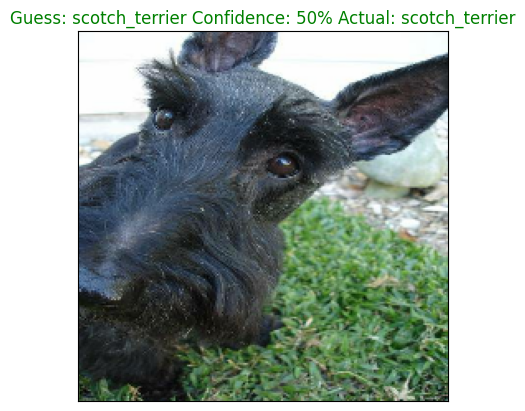

In [60]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Top 10 accuracy:

Predicting and visualsing our top 10 predictions.

Function:
- Input of prediction probability array, ground truth array, integer
- Find predicted label using get_pred_label
- Find the top 10 prediction probability index, pred prob values and pred prob labels
- Plot top 10 pred prob values and labels, colouring true as green

In [61]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  #Define
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] #the ::-1 puts it into descending order

  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey") #X-values are prediction labels with a range of 10
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical") #Names of top 10 pred labels

  #Add colour to true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

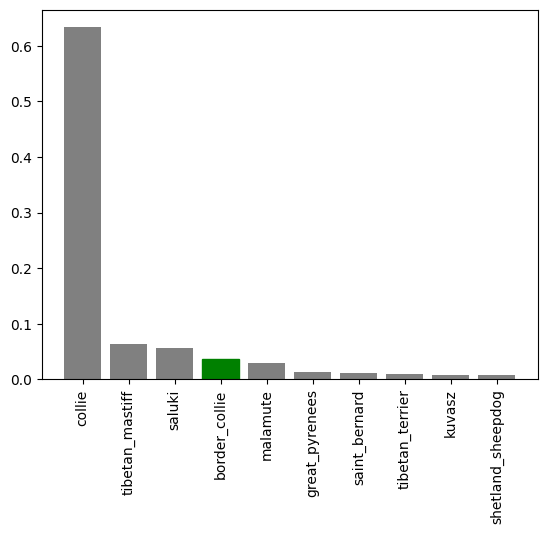

In [62]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

- Top 10 predictions our model has made.
- X-axis shows prediction label
- y-axis shows prediction value
- The true label is in green.
- The machine has predicted collie, but the correct label is border_collie.

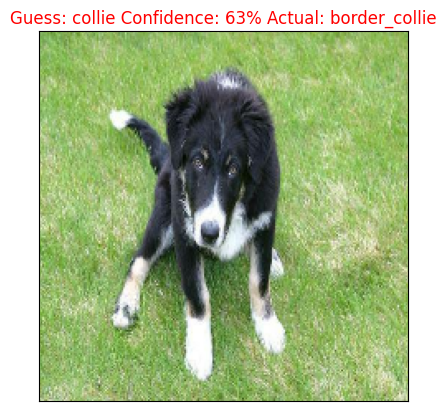

In [63]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=9)

Visualising multiple predictions and their values


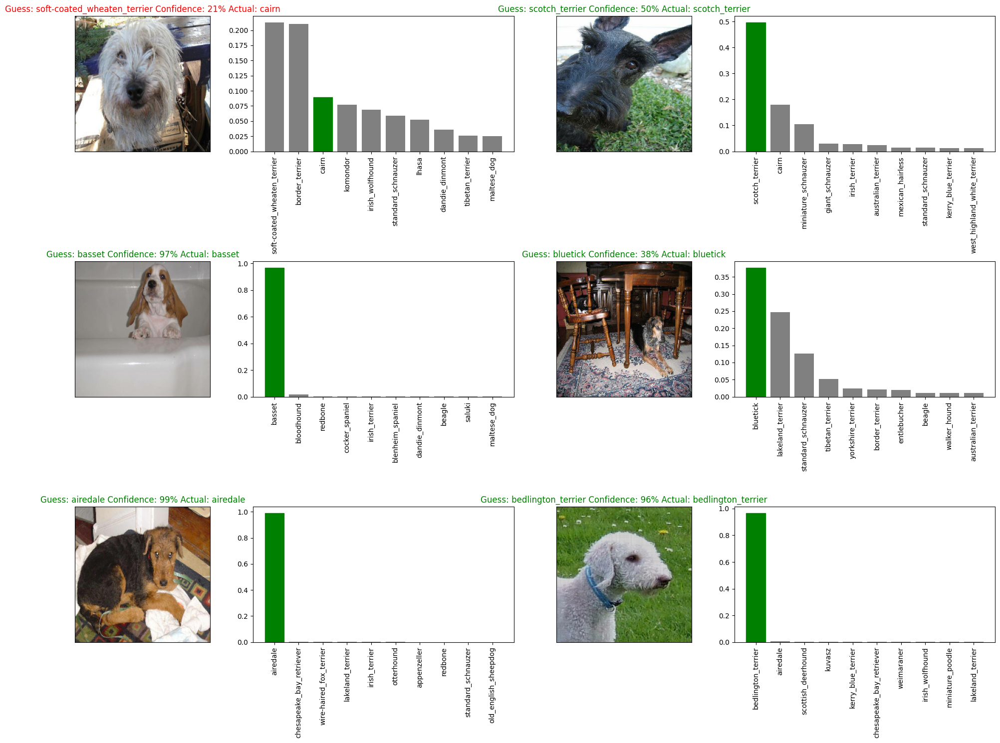

In [64]:
#Define subplot
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

#Create Subplot
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0) #neaten layout with height_padding
plt.show()

Saving and reloading a trained model
- allows model to be saved, reloaded, shared and exported

In [65]:
#Function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  #Create a model directory path name with current time
  model_dir = os.path.join("/content/drive/MyDrive/Dog Identify/dog-breed-identification/models",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = model_dir + "-" + suffix + ".h5" #.h5 is save format
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [66]:
#Function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path"""
  print(f"Loading saved model from {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  #Custom objects lets the model know we have an irregular layer it wont have seen before because we ar using Tensor Flow

  return model

In [67]:
#Save our model trained on 1000 images
#save_model(model, suffix="1000=images-mobilenetv2-Adam")

In [68]:
#Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Identify/dog-breed-identification/models/20230901-12011693569715-1000=images-mobilenetv2-Adam.h5')

Loading saved model from /content/drive/MyDrive/Dog Identify/dog-breed-identification/models/20230901-12011693569715-1000=images-mobilenetv2-Adam.h5...


Making sure the pre-saved model and loaded model has the same data & results

In [69]:
#Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 77ms/step - loss: 1.2570 - accuracy: 0.6450


[1.2569942474365234, 0.6449999809265137]

In [70]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 73ms/step - loss: 1.2272 - accuracy: 0.6500


[1.227200984954834, 0.6499999761581421]

Training Model on Full Dataset

In [71]:
len(X), len(y)

(10222, 10222)

In [72]:
#Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [73]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [74]:
#Create a model for full model
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [77]:
#Create full model callbacks
#Tensorboard callback - to track performance of model and compare to others
full_model_tensorboard = create_tensorboard_callback()
#No validation set when training on all the data = cannot monitor validation accuracy. Stop overfitting at 3 epochs.
full_model_earlystopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience =3)

In [79]:
#Fit full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_earlystopping])

Epoch 1/100
320/320 [==============================] - 34s 94ms/step - loss: 1.3303 - accuracy: 0.6734
Epoch 2/100
320/320 [==============================] - 42s 131ms/step - loss: 0.4002 - accuracy: 0.8836
Epoch 3/100
320/320 [==============================] - 32s 100ms/step - loss: 0.2359 - accuracy: 0.9350
Epoch 4/100
320/320 [==============================] - 30s 92ms/step - loss: 0.1545 - accuracy: 0.9617
Epoch 5/100
320/320 [==============================] - 30s 94ms/step - loss: 0.1072 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0768 - accuracy: 0.9862
Epoch 7/100
320/320 [==============================] - 30s 95ms/step - loss: 0.0593 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0454 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0378 - accuracy: 0.9950
Epoch 10/100
320/320 [==============================] - 29s 90ms/step 

In [81]:
#Save the model
#save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Identify/dog-breed-identification/models/20230908-18001694196009-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog Identify/dog-breed-identification/models/20230908-18001694196009-full-image-set-mobilenetv2-Adam.h5'

In [82]:
#Load saved model
loaded_full_model = load_model("/content/drive/MyDrive/Dog Identify/dog-breed-identification/models/20230908-18001694196009-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from /content/drive/MyDrive/Dog Identify/dog-breed-identification/models/20230908-18001694196009-full-image-set-mobilenetv2-Adam.h5...


In [83]:
len(X)

10222

Making predictions on test dataset

To make predictions on the test data, we need to get it in the same format as our trained data.

1. Get the test image filenames
2. Convert filenames into test data batches using create_data_batches and setting test_data paremeter to True (since the test data does not have labels)
3. Make predictions array by passing test batches through predict() method on our model.

In [95]:
#Load test image filenames
test_path = "/content/drive/MyDrive/Dog Identify/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:2]

['/content/drive/MyDrive/Dog Identify/test/e18fbb12037c297b90642e99073cd6b4.jpg',
 '/content/drive/MyDrive/Dog Identify/test/de3fbd6fb5444fcf14390ac90545c2f1.jpg']

In [96]:
len(test_filenames)

10357

In [97]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [98]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [99]:
#Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 165s 494ms/step


In [101]:
#Save predictions (NumPy Array) to csv file to access later
np.savetxt("/content/drive/MyDrive/Dog Identify/preds_array.csv", test_predictions, delimiter=",")

In [102]:
#Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Identify/preds_array.csv", delimiter=",")

In [103]:
test_predictions[:2]

array([[2.94411837e-08, 4.91434760e-09, 1.27316850e-08, 2.59184478e-08,
        4.36558548e-06, 4.27076430e-10, 9.27690089e-01, 4.32017401e-07,
        1.09218758e-08, 4.32152980e-09, 2.34851964e-11, 4.38119855e-07,
        2.63592632e-08, 2.77403123e-09, 4.81696354e-08, 2.66495226e-09,
        2.46726017e-07, 1.50409932e-07, 9.55879386e-12, 2.30510144e-09,
        2.47552356e-09, 2.39113479e-10, 1.08317300e-09, 6.77831391e-09,
        1.28230884e-10, 3.91762228e-07, 1.17341429e-03, 8.05837175e-09,
        5.37126385e-11, 2.03855038e-07, 2.27218049e-08, 3.21830673e-09,
        4.24061390e-08, 8.47615453e-08, 3.20947609e-11, 2.87803026e-08,
        1.59806586e-08, 6.62686617e-09, 2.63123461e-08, 2.92346009e-11,
        8.32018066e-10, 2.81046797e-10, 4.04866629e-09, 2.22867540e-11,
        6.79297105e-11, 3.56790650e-07, 3.82911225e-07, 4.57985837e-11,
        1.03214270e-09, 4.54442173e-09, 1.89570972e-08, 3.57790042e-09,
        8.46195423e-12, 4.09461753e-09, 4.54598457e-08, 6.393969

In [104]:
test_predictions.shape

(10357, 120)

Submitting to Kaggle

To get the data in the right format:
- Create a pandas dataframe with an ID column as well as a column for each dog breed
- Add data to ID column by extracting test image from their file paths
- Add data (the prediction probabilities) to each of the dog breed columns
- Export DataFrame as CSV to submit to Kaggle

In [109]:
#Create pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [110]:
#Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]

In [111]:
os.path.splitext(test_filenames[0])

('/content/drive/MyDrive/Dog Identify/test/e18fbb12037c297b90642e99073cd6b4',
 '.jpg')

In [112]:
preds_df["id"] = test_ids

In [113]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e18fbb12037c297b90642e99073cd6b4, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"(de3fbd6fb5444fcf14390ac90545c2f1, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"(dd8c716a81edb1cac3d4cb2b6c47880a, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"(de93f567cf5830e982182435db086b93, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"(e5ad4cc7818e4eed04d209da177afa6f, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [114]:
#Add prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e18fbb12037c297b90642e99073cd6b4, .jpg)",2.944118e-08,4.914348e-09,1.273169e-08,2.591845e-08,4.365585e-06,4.270764e-10,9.276901e-01,4.320174e-07,1.092188e-08,...,9.526889e-08,3.724772e-06,2.712285e-08,5.626355e-10,3.198913e-09,5.464512e-08,1.524834e-06,2.943634e-09,9.248852e-07,6.928786e-02
1,"(de3fbd6fb5444fcf14390ac90545c2f1, .jpg)",2.727799e-09,3.877187e-11,1.490375e-08,9.157983e-11,7.617418e-05,2.111332e-09,8.592593e-09,1.180662e-05,3.771250e-09,...,1.140733e-08,1.352987e-05,9.617706e-09,1.275143e-09,2.878298e-11,1.537688e-12,2.061658e-11,7.927265e-04,1.498738e-10,5.730026e-10
2,"(dd8c716a81edb1cac3d4cb2b6c47880a, .jpg)",8.542011e-11,4.789891e-10,1.882941e-11,8.670324e-07,1.835916e-11,1.697791e-09,9.576671e-12,7.261948e-12,3.656524e-10,...,2.482517e-11,8.218885e-13,8.434884e-10,1.491858e-07,7.116177e-09,5.467241e-11,4.283338e-11,1.366750e-09,2.968830e-09,7.207731e-12
3,"(de93f567cf5830e982182435db086b93, .jpg)",1.567830e-09,5.526547e-12,1.109301e-09,1.478116e-10,1.571282e-05,3.473114e-08,3.283947e-08,8.317385e-03,8.850932e-03,...,5.397915e-09,2.877195e-04,4.414604e-07,9.653156e-09,1.566308e-09,3.084521e-06,4.328159e-08,3.045395e-09,3.608665e-06,8.337715e-09
4,"(e5ad4cc7818e4eed04d209da177afa6f, .jpg)",8.123190e-09,2.030547e-06,8.729101e-09,1.962077e-06,5.691482e-04,1.177005e-05,1.277176e-07,2.937639e-06,7.837782e-08,...,5.097254e-06,2.003242e-06,5.827671e-01,1.403457e-04,4.679819e-06,3.928616e-07,1.823755e-08,6.996020e-04,2.404900e-04,2.137143e-06


In [115]:
#Save prediction dataframe to csv for kaggle submission
preds_df.to_csv("/content/drive/MyDrive/Dog Identify/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

Making Predictions on Custom Images

1. Get the filepathsof our own images
2. Turn the filepaths into data batches using create_data_batches. Set test_data to True as we dont have labels
3. Pass the custom image data batch to our models predict() method
4. Convert predictions output probabilties to prediction labels
5. Compare predicted labels to custom images

In [124]:
#Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Identify/custom/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [125]:
custom_image_paths

['/content/drive/MyDrive/Dog Identify/custom/Screenshot 2023-09-08 at 20.12.36.png',
 '/content/drive/MyDrive/Dog Identify/custom/Screenshot 2023-09-08 at 20.12.14.png',
 '/content/drive/MyDrive/Dog Identify/custom/Screenshot 2023-09-08 at 20.12.25.png']

In [127]:
#Turn custom images into data batchsets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [131]:
#Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 68ms/step


In [132]:
custom_preds.shape

(3, 120)

In [135]:
#Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['eskimo_dog', 'siberian_husky', 'eskimo_dog']

In [137]:
#Get custom images
custom_images = []

#Loop through unbatched data
for images in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(images)

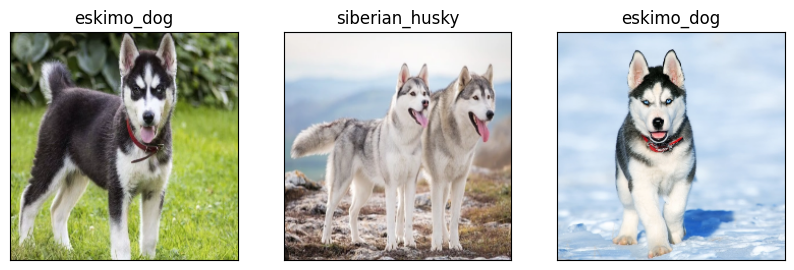

In [139]:
#Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

Thanks for reading :)
- Amber Lowman